In [1]:
import pandas as pd

dim_teachers = pd.read_csv('dim_teachers.csv')
fct_teachers_contents_interactions = pd.read_csv('fct_teachers_contents_interactions.csv')
fct_teachers_entries = pd.read_csv('fct_teachers_entries.csv')
stg_formation = pd.read_csv('stg_formation.csv')
stg_mari_ia_conversation = pd.read_csv('stg_mari_ia_conversation.csv')
stg_mari_ia_reports = pd.read_csv('stg_mari_ia_reports.csv')


### 1. Criação da variável "last_access_date" para inserir na dim_teachers  a última vez que acessou a plataforma.

In [2]:
# Change the date format to datetime
fct_teachers_entries['data_inicio'] = pd.to_datetime(fct_teachers_entries['data_inicio'])
dim_teachers['data_entrada'] = pd.to_datetime(dim_teachers['data_entrada'])
fct_teachers_entries['data_fim'] = pd.to_datetime(fct_teachers_entries['data_fim'])
stg_mari_ia_conversation['updatedat'] = pd.to_datetime(stg_mari_ia_conversation['updatedat'])


In [3]:


# Merge fct_teachers_entries with stg_mari_ia_conversation
merged = pd.merge(
    fct_teachers_entries,
    stg_mari_ia_conversation,
    left_on='unique_id',
    right_on='unique_id_aprendizap',
    how='left'
)

# Aggregate to get max dates per unique_id
last_access_platform = merged.groupby('unique_id').agg({
    'data_fim': 'max',
    'updatedat': 'max'
}).reset_index().rename(columns={
    'data_fim': 'last_access_date',
    'updatedat': 'last_access_ia'
})

# Merge with dim_teachers
dim_teachers = pd.merge(
    dim_teachers,
    last_access_platform,
    on='unique_id',
    how='left'
)

# Create the final last_access_date column
dim_teachers['last_access_date'] = dim_teachers[['last_access_date', 'last_access_ia']].max(axis=1)

### 2. Gráfico de quantidade de mês em que cliente acessou pela última vez a plataforma:

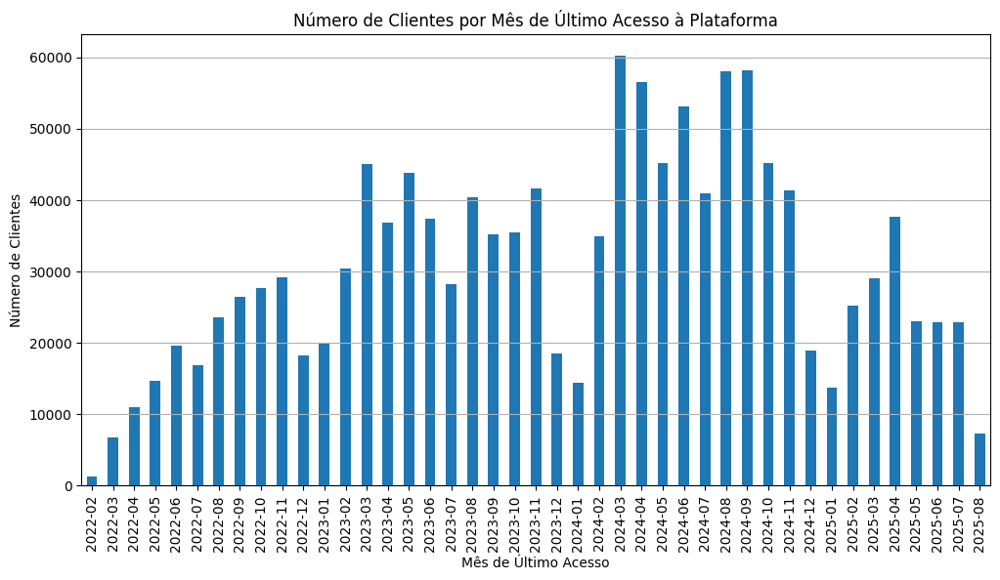

In [4]:
import matplotlib.pyplot as plt

# Chart showing the number of unique_id by month of last_access_date
dim_teachers['last_access_month'] = dim_teachers['last_access_date'].dt.to_period('M')
last_access_month_counts = dim_teachers['last_access_month'].value_counts().sort_index()
plt.figure(figsize=(12, 6))
last_access_month_counts.plot(kind='bar')
plt.title('Número de Clientes por Mês de Último Acesso à Plataforma')
plt.xlabel('Mês de Último Acesso')
plt.ylabel('Número de Clientes')
plt.grid(axis='y')
plt.show()


De fevereiro 2024 até setembro do mesmo ano há um aparente número de pessoas que acessaram a plataforma pela última vez, podendo concluir que foi um período que ocorreu muito churn.

### 3. Gráfico de ganho de clientes por mês:

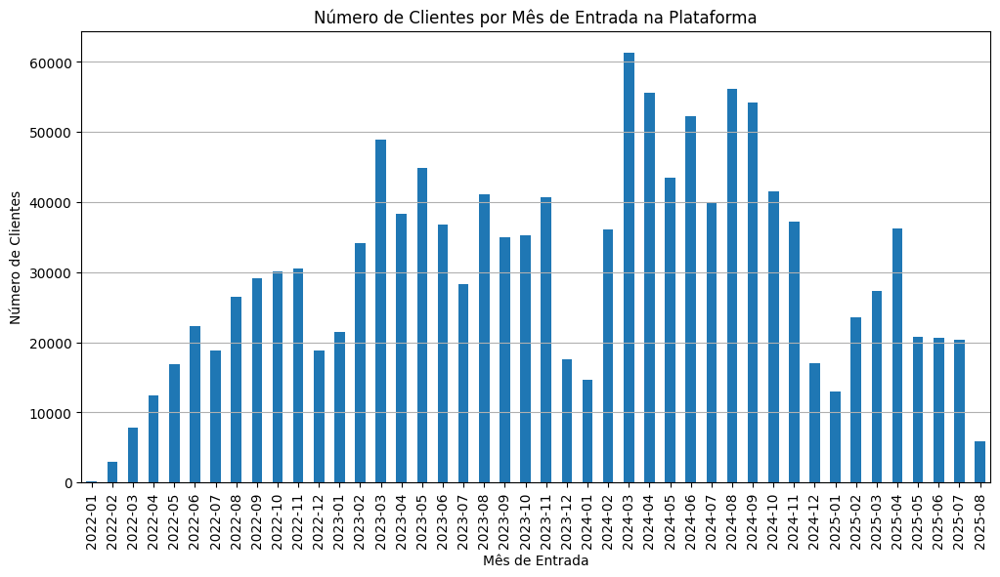

In [5]:
# Chart showing the numbers of unique_id by month of data_entrada
dim_teachers['data_entrada_month'] = dim_teachers['data_entrada'].dt.to_period('M')
data_entrada_month_counts = dim_teachers['data_entrada_month'].value_counts().sort_index()
plt.figure(figsize=(12, 6))
data_entrada_month_counts.plot(kind='bar')
plt.title('Número de Clientes por Mês de Entrada na Plataforma')
plt.xlabel('Mês de Entrada')
plt.ylabel('Número de Clientes')
plt.grid(axis='y')
plt.show()

A linha do tempo com o número de usuários novos é muito parecida com o gráfico de número de usuários por último dia de acesso, podendo concluir que há muitas pessoas que acessam a plataforma e saem no mesmo dia sem voltar novamente.

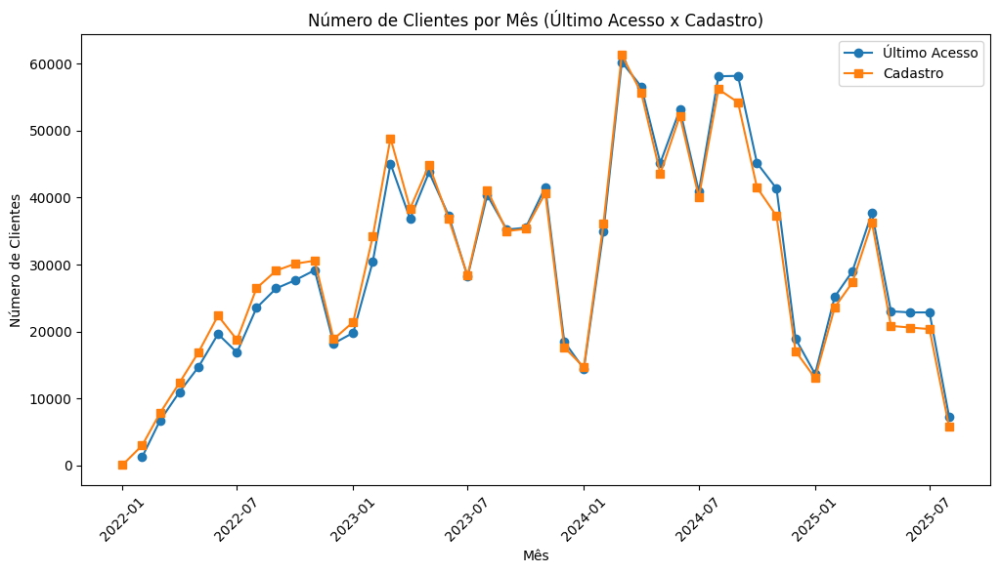

In [6]:
import matplotlib.pyplot as plt

# Converter para período mensal
dim_teachers['last_access_month'] = dim_teachers['last_access_date'].dt.to_period('M')
dim_teachers['data_entrada_month'] = dim_teachers['data_entrada'].dt.to_period('M')

# Contagens (removendo valores nulos antes)
last_access_month_counts = (
    dim_teachers['last_access_month']
    .dropna()
    .value_counts()
    .sort_index()
)

data_entrada_month_counts = (
    dim_teachers['data_entrada_month']
    .dropna()
    .value_counts()
    .sort_index()
)

# Criar figura
plt.figure(figsize=(12, 6))

# Plotar as duas séries no mesmo gráfico (conversão para datetime no eixo X)
plt.plot(last_access_month_counts.index.to_timestamp(), last_access_month_counts.values, 
         marker='o', label='Último Acesso')
plt.plot(data_entrada_month_counts.index.to_timestamp(), data_entrada_month_counts.values, 
         marker='s', label='Cadastro')

# Customizações
plt.title('Número de Clientes por Mês (Último Acesso x Cadastro)')
plt.xlabel('Mês')
plt.ylabel('Número de Clientes')
plt.xticks(rotation=45)
plt.grid(axis='y')
plt.legend()

# Desligar grid
plt.grid(False)

plt.show()

Esse gráfico comprova a teste mencionada na última célula, então percebe-se que o churn rápido é um problema. O próximo passo é entender se há um tipo de usuário específico que dá mais churn (por exemplo professor de ensino médio ou fundamental).

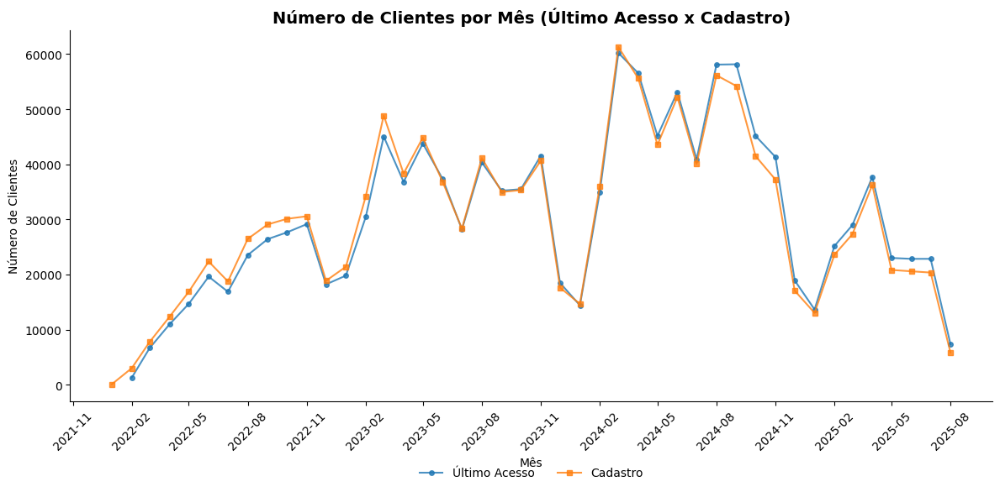

In [7]:
import matplotlib.pyplot as plt
import matplotlib.dates as mdates

plt.figure(figsize=(12, 6))

plt.plot(last_access_month_counts.index.to_timestamp(), last_access_month_counts.values, 
         marker='o', markersize=4, linewidth=1.5, alpha=0.8, label='Último Acesso')
plt.plot(data_entrada_month_counts.index.to_timestamp(), data_entrada_month_counts.values, 
         marker='s', markersize=4, linewidth=1.5, alpha=0.8, label='Cadastro')

# Customizações
plt.title('Número de Clientes por Mês (Último Acesso x Cadastro)', fontsize=14, weight='bold')
plt.xlabel('Mês')
plt.ylabel('Número de Clientes')

# Eixo X mais limpo
plt.xticks(rotation=45)
plt.gca().xaxis.set_major_locator(mdates.MonthLocator(interval=3))
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter("%Y-%m"))

# Grid mais leve
plt.grid(False)

# Remover bordas
for spine in ["top", "right"]:
    plt.gca().spines[spine].set_visible(False)

# Legenda fora do gráfico
plt.legend(
    frameon=False, 
    loc='upper center',          # ancora pela parte superior da legenda
    bbox_to_anchor=(0.5, -0.15), # centralizado no eixo X, deslocado para baixo
    ncol=2
)

plt.tight_layout()
plt.show()


### 4. Analisar life time dos clientes, separando por categorias dos usuários:

In [8]:
# Criar coluna com last_access_date - data_entrada
dim_teachers['lifetime_days'] = (dim_teachers['last_access_date'] - dim_teachers['data_entrada']).dt.days

In [9]:
# Dicionário de tradução
subject_map = {
    "1": "Português",
    "2": "História",
    "3": "Geografia",
    "4": "Arte",
    "5": "Matemática",
    "6": "Ciências",
    "7": "Inglês",
    "8": "Linguagens",
    "9": "Ciênc. Humanas",
    "10": "Matemática",
    "11": "Ciênc. da Natureza",
    "12": "Projeto de Vida",
    "13": "Enem Descomplica",
    "14": "Direitos Humanos",
    "15": "Tecnologia",
    "ciencias" : "Ciências",
    "humanas" : "História",
    "linguagens" : "Linguagens",
    "matematica" : "Matemática",
    "vida" : "Arte"
}

# Mapear e manter o valor original caso não esteja no dicionário
dim_teachers['name_currentsubject'] = dim_teachers['currentsubject'].map(subject_map).fillna(dim_teachers['currentsubject'])


### 5. Análise de Cohort:

Cohort Retention Table (%):
            0           1           2          3          4          5   \
2022-01  100.0  100.000000  100.000000  86.458333  79.166667  77.083333   
2022-02  100.0   70.143286   41.086305  36.721093  35.654782  33.455515   
2022-03  100.0   29.403446   17.292363  14.669581  12.869632  11.905374   
2022-04  100.0   19.687272   12.760269  10.994086   9.778822   8.830916   
2022-05  100.0   21.058245   14.433845  12.786633  11.506784  10.339515   
2022-06  100.0   20.225423   14.844798  13.449325  12.188031  11.096699   
2022-07  100.0   18.019411   13.129266  11.828072  10.574872   9.609642   
2022-08  100.0   19.851913   13.815118  12.069812  10.687167   9.840958   
2022-09  100.0   18.505020   13.044973  11.294870  10.201485   9.826709   
2022-10  100.0   18.027505   12.842147  11.101515  10.563380   9.749535   
2022-11  100.0   15.445000   10.996631  10.352272   9.534557   8.497694   
2022-12  100.0   13.638051   10.260353   9.332414   8.356753   7.365184 

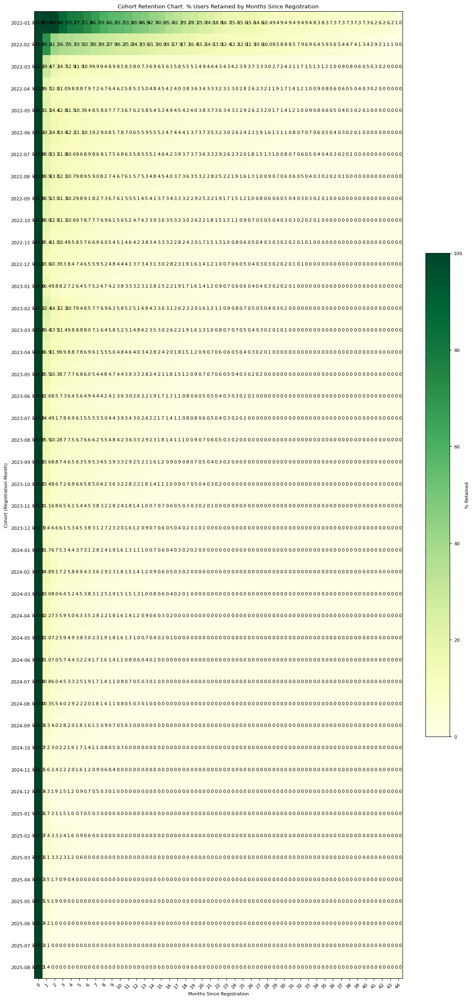

In [10]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt


df = dim_teachers
# --- End of sample data ---

# Convert lifetime_days to approximate lifetime_months (adjust 30 if needed)
df['lifetime_months'] = np.ceil(df['lifetime_days'].fillna(0) / 30).astype(int)

# Get sorted unique cohorts (assuming 'YYYY-MM' string format; sorts lexicographically)
cohorts = sorted(df['data_entrada_month'].unique())

# Find the maximum lifetime month across all users
max_month = df['lifetime_months'].max()

# Build the cohort retention data
cohort_data = {}
for cohort in cohorts:
    cohort_users = df[df['data_entrada_month'] == cohort]
    cohort_size = len(cohort_users)
    retention = []
    for month in range(max_month + 1):
        retained = (cohort_users['lifetime_months'] >= month).sum()
        percentage = (retained / cohort_size) * 100 if cohort_size > 0 else 0
        retention.append(percentage)
    cohort_data[cohort] = retention

# Create a Pandas DataFrame for the cohort table (rows: cohorts, columns: months)
months = list(range(max_month + 1))
cohort_df = pd.DataFrame(cohort_data, index=months).T  # Transpose for rows as cohorts

# Print the cohort table for quick inspection
print("Cohort Retention Table (%):")
print(cohort_df)

# Set a smaller default font size for the entire plot
plt.rcParams['font.size'] = 8  # Changed from default (usually 10)

# Visualize as a heatmap chart
fig, ax = plt.subplots(figsize=(12, len(cohorts) * 0.5 + 2))  # Adjust size based on number of cohorts
im = ax.imshow(cohort_df.values, cmap='YlGn', aspect='auto')  # Heatmap with yellow-green colormap

# Set labels
ax.set_xticks(np.arange(len(months)))
ax.set_yticks(np.arange(len(cohorts)))
ax.set_xticklabels(months)
ax.set_yticklabels(cohorts)
plt.setp(ax.get_xticklabels(), rotation=45, ha="right", rotation_mode="anchor")

# Add text annotations to each cell
for i in range(len(cohorts)):
    for j in range(len(months)):
        text = ax.text(j, i, f"{cohort_df.iloc[i, j]:.1f}", ha="center", va="center", color="black")

# Titles and labels
ax.set_title("Cohort Retention Chart: % Users Retained by Months Since Registration")
ax.set_xlabel("Months Since Registration")
ax.set_ylabel("Cohort (Registration Month)")

# Colorbar
fig.colorbar(im, ax=ax, label='% Retained', shrink=0.5)

# Show the chart (in Jupyter, it displays inline; otherwise, saves or shows window)
plt.tight_layout()
plt.show()

# Optional: Save the chart to a file
# plt.savefig('cohort_chart.png', dpi=300)

No início da plataforma, em 2022, os usuários usavam-a por mais tempo, com a maior parte ficando até o terceiro mês, e isso caiu com o tempo. Em 2025 a grande maioria dos usuários deixam a plataforma no primeiro mês.

### 6. Há algum estado com maior lifetime?

In [11]:
import pandas as pd
import plotly.express as px
import requests
import json

df = dim_teachers

# Compute average lifetime by state
avg_lifetime = df.groupby('estado')['lifetime_days'].mean().reset_index()
avg_lifetime.columns = ['estado', 'avg_lifetime_days']  # Rename for clarity

# Fetch Brazil states GeoJSON (public source)
geojson_url = 'https://raw.githubusercontent.com/codeforamerica/click_that_hood/master/public/data/brazil-states.geojson'
response = requests.get(geojson_url)
geojson = json.loads(response.text)

# Create the choropleth map
fig = px.choropleth(
    avg_lifetime,
    geojson=geojson,
    locations='estado',  # Your state column (assumes abbreviations like 'SP')
    featureidkey='properties.sigla',  # Matches GeoJSON property (change to 'properties.name' if using full state names)
    color='avg_lifetime_days',
    color_continuous_scale='Viridis',  # Color scale (higher values darker)
    labels={'avg_lifetime_days': 'Avg Lifetime (Days)'},
    title='Average Customer Lifetime by State in Brazil'
)

# Update map layout (fit to Brazil, add hover info)
fig.update_geos(fitbounds='locations', visible=False)
fig.update_layout(
    margin={'r':0, 't':40, 'l':0, 'b':0},
    coloraxis_colorbar={'title': 'Avg Lifetime (Days)'}
)

# Show the interactive map (in Jupyter, it displays inline; otherwise, opens in browser)
fig.show()

# Optional: Save as HTML (interactive) or PNG (static)
# fig.write_html('brazil_lifetime_map.html')
# fig.write_image('brazil_lifetime_map.png')

### 7. Qual foi o último conteúdo acessado antes de dar churn? Há algum event_type ou content_type que mais precedem um churn?

Considerando que o usuário deu churn se não acessou a plataforma em mais de 3 meses.

In [12]:
# Identify the last date in the dataset
last_date = dim_teachers['last_access_date'].max()
print(f"Last date in dataset: {last_date}")

Last date in dataset: 2025-08-06 18:52:54.876999936


In [13]:
# Creating new column of date since last access
dim_teachers['days_since_last_access'] = ( last_date- dim_teachers['last_access_date']).dt.days

In [14]:
import pandas as pd

fct = fct_teachers_contents_interactions
dim = dim_teachers

# Convert data_inicio to datetime if needed
fct['data_inicio'] = pd.to_datetime(fct['data_inicio'])

# Step 1: Aggregate to get MAX(data_inicio) per group
grouped = fct.groupby(['unique_id', 'event_type', 'content_type'])['data_inicio'].max().reset_index()
grouped = grouped.rename(columns={'data_inicio': 'last_interaction'})

# Step 2: Merge with dim_teachers (LEFT JOIN on unique_id)
result = pd.merge(
    grouped,
    dim[['unique_id', 'days_since_last_access']],
    on='unique_id',
    how='left'
)

# Step 3: Select and order columns as in SQL
result = result[['unique_id', 'last_interaction', 'event_type', 'content_type', 'days_since_last_access']]



Filtrando só por 2025 para ter dados mais recentes:

In [15]:
import pandas as pd

# Ensure datetime conversion
fct["data_inicio"] = pd.to_datetime(fct["data_inicio"])
stg_mari_ia_reports["updatedat"] = pd.to_datetime(stg_mari_ia_reports["updatedat"])

# CTE a
a = (
    fct.merge(dim, on="unique_id", how="left")
    .groupby(["unique_id", "event_type", "content_type", "days_since_last_access"], as_index=False)
    .agg(last_interaction=("data_inicio", "max"))
)

# CTE b
b = (
    stg_mari_ia_reports.groupby("unique_id_aprendizap", as_index=False)
    .agg(last_ia_interaction=("updatedat", "max"))
)

# Final join with safe datetime comparison
final = (
    a.merge(b, left_on="unique_id", right_on="unique_id_aprendizap", how="left")
)

final["last_interaction_final"] = final[["last_interaction", "last_ia_interaction"]].max(axis=1, skipna=True)

final["event_type_final"] = final.apply(
    lambda row: row["event_type"] if pd.notna(row["last_interaction"]) 
                and (row["last_ia_interaction"] is pd.NaT or row["last_interaction"] >= row["last_ia_interaction"]) 
                else "Mari_IA",
    axis=1
)

final = final[['unique_id', 'last_interaction', 'event_type', 'event_type_final' ,'content_type', 'days_since_last_access']]

final.head()


,unique_id,last_interaction,event_type,event_type_final,content_type,days_since_last_access
0,0000e109-ac25-4927-9b50-14391e68a74e,2025-07-26 02:58:57.170,visualizacao_metodologia_ativa,visualizacao_metodologia_ativa,pagina_metodologia_ativa,11.0
1,00019a49-6ffd-4c34-b9f9-a6f3c8c9802d,2023-03-08 14:12:23.775,download_aula,download_aula,pdf,882.0
2,0001e353-375c-418e-ab72-1b3306726b70,2023-10-21 08:40:12.543,download_aula,download_aula,pdf,655.0
3,0001e353-375c-418e-ab72-1b3306726b70,2023-10-21 08:51:30.872,download_aula,download_aula,png,655.0
4,00036784-c781-426b-b42b-6d16eab4260d,2024-08-08 22:05:31.081,download_aula,download_aula,png,252.0


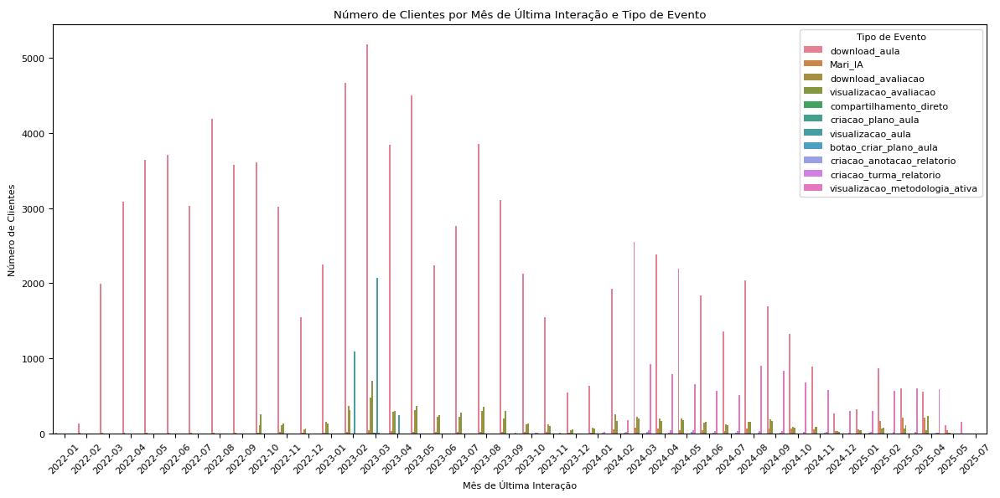

In [16]:
import seaborn as sns

# select only the data with days_since_last_access > 90
final = final[final['days_since_last_access'] > 90]

# Plot a chart with the number of unique_id by month of last_interactioz by event_type
final['last_interaction_month'] = final['last_interaction'].dt.to_period('M')
monthly_counts = final.groupby(['last_interaction_month', 'event_type_final']).size().reset_index(name='count')
plt.figure(figsize=(12, 6))
sns.barplot(
    data=monthly_counts,
    x='last_interaction_month',
    y='count',
    hue='event_type_final'
)
plt.title('Número de Clientes por Mês de Última Interação e Tipo de Evento')
plt.xlabel('Mês de Última Interação')
plt.ylabel('Número de Clientes')
plt.xticks(rotation=45)
plt.legend(title='Tipo de Evento')
plt.tight_layout()
plt.show()

Filtrando só 2025 para ter dados mais recentes:

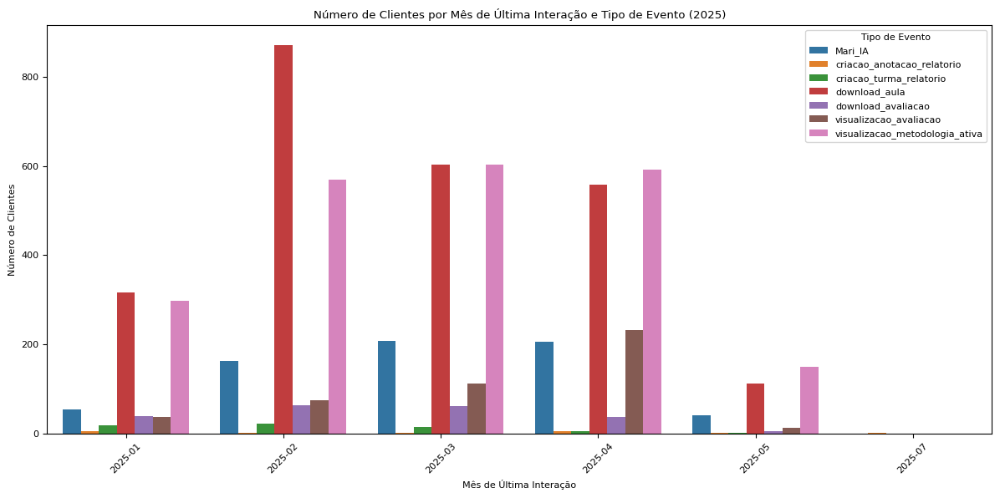

In [17]:
# Filtrando só por 2025 para ter dados mais recentes:
final['last_interaction_year'] = final['last_interaction'].dt.year
final = final[final['last_interaction_year'] == 2025]
# Plot a chart with the number of unique_id by month of last_interaction by event_type
final['last_interaction_month'] = final['last_interaction'].dt.to_period('M')
monthly_counts = final.groupby(['last_interaction_month', 'event_type_final']).size().reset_index(name='count')
plt.figure(figsize=(12, 6))
sns.barplot(
    data=monthly_counts,
    x='last_interaction_month',
    y='count',
    hue='event_type_final'
)
plt.title('Número de Clientes por Mês de Última Interação e Tipo de Evento (2025)')
plt.xlabel('Mês de Última Interação')
plt.ylabel('Número de Clientes')
plt.xticks(rotation=45)
plt.legend(title='Tipo de Evento')
plt.tight_layout()
plt.show()

Na maior parte dos casos, o último evento do cliente antes de dar churn é download da aula, porém a partir de fevereiro de 2025 há um crescimento de churns onde a última atividade é visualização de metodologia ativa. 

### 8. Dos consumidores que mais usam a plataforma, que conteúdo eles mais acessam?

Descobrir a média de interações por mês por usuário, para assim identificar os usuários que mais acessam a plataforma:

In [18]:
import pandas as pd

df = fct_teachers_entries

# Ensure datetime
df["data_inicio"] = pd.to_datetime(df["data_inicio"])

# --- Average interactions per month ---
df["year_month"] = df["data_inicio"].dt.to_period("M")

interactions_monthly = (
    df.groupby(["unique_id", "year_month"])
    .size()
    .reset_index(name="interactions_count")
)

avg_interactions = (
    interactions_monthly.groupby("unique_id")["interactions_count"]
    .mean()
    .reset_index(name="avg_interactions_per_month")
)

# --- Max date per user ---
max_date = (
    df.groupby("unique_id")["data_inicio"]
    .max()
    .reset_index(name="max_data_inicio")
)

# --- Final table ---
final = (
    avg_interactions.merge(max_date, on="unique_id", how="left")
)

print(final.head())


                              unique_id  avg_interactions_per_month  \
0  000005b8-e073-4b3d-858a-cc2a51f6ae76                         1.0   
1  00000ac4-2412-4cba-a7fd-000271cd2459                         1.0   
2  00001d14-1398-4e03-b1b7-561cb2d2423a                         2.0   
3  00003562-eb2f-481b-a082-f30dc8cb3d4a                         2.0   
4  00003a13-91d1-46bf-934d-72f17f4c5a12                         1.0   

          max_data_inicio  
0 2023-08-18 08:15:20.728  
1 2022-08-11 14:51:04.331  
2 2024-09-17 08:19:59.387  
3 2023-10-18 11:07:35.696  
4 2024-09-02 09:19:56.877  


In [19]:
# Join final with dim_teachers to include the column avg_interactions_per_month in dim_teachers
dim_teachers = dim_teachers.merge(final[['unique_id', 'avg_interactions_per_month']], on='unique_id', how='left')

In [20]:
# Create a table showing avg_interactions_per_month column ,name_currentsubject and count of unique_id:
table = (
    dim_teachers.groupby(['name_currentsubject', 'avg_interactions_per_month'], observed=True)
    .agg(num_users=('unique_id', 'nunique'))
    .reset_index()
    .sort_values(by='num_users', ascending=False)
)
table

# Export to CSV
table.to_csv('table.csv', index=False)

In [21]:
# filter only the rows where avg_interactions_per_month > 1
table = table[table['avg_interactions_per_month'] > 1]
table

,name_currentsubject,avg_interactions_per_month,num_users
2500,Português,2.000000,7540
2547,Português,3.000000,4355
2074,Matemática,2.000000,4208
142,Arte,2.000000,2990
823,Geografia,2.000000,2957
...,...,...,...
3007,Português,18.791667,1
1333,História,4.545455,1
1332,História,4.529412,1
3003,Português,18.285714,1


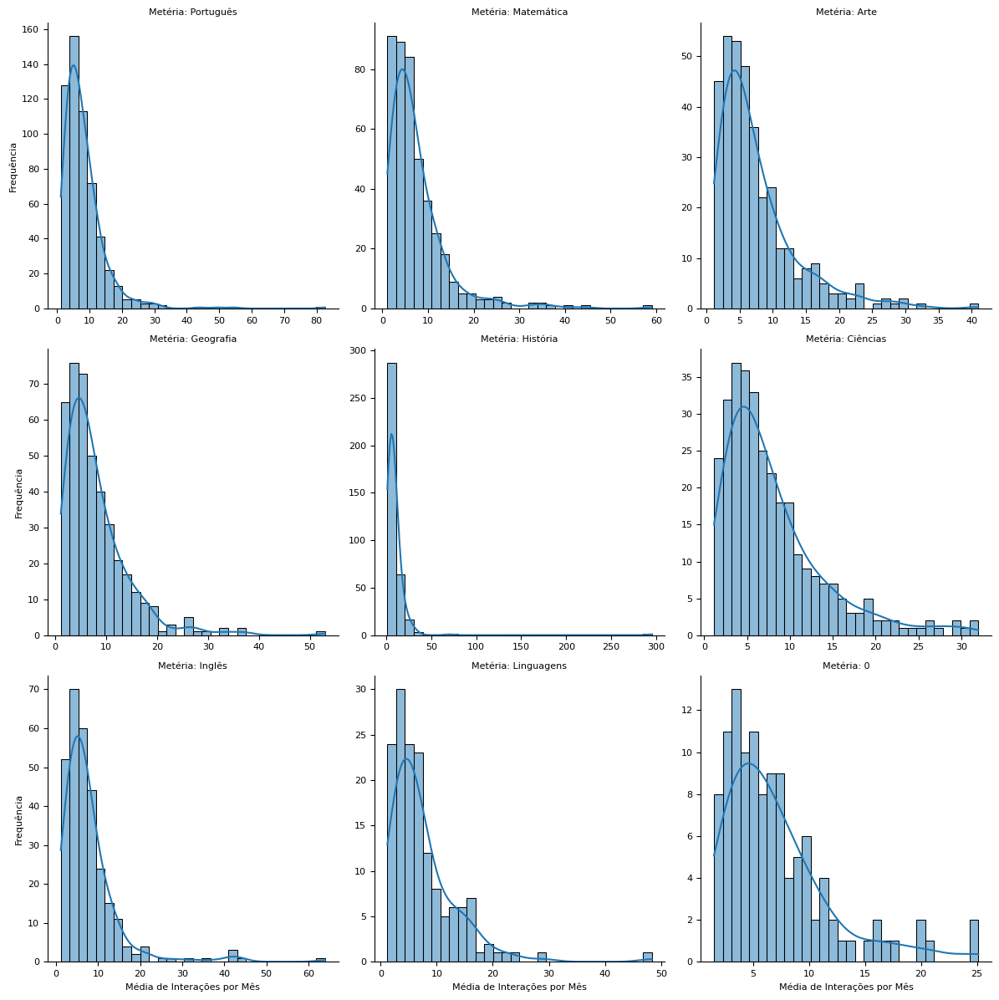

In [22]:
import matplotlib.pyplot as plt
import seaborn as sns

# Build histogram of avg_interactions_per_month for each subject
g = sns.FacetGrid(
    table,
    col="name_currentsubject",
    col_wrap=3,         # adjust how many per row
    height=4,           # size of each subplot
    sharex=False,       # allow different scales per subject
    sharey=False
)

g.map(
    sns.histplot,
    "avg_interactions_per_month",
    bins=30,
    kde=True
)

g.set_axis_labels("Média de Interações por Mês", "Frequência")
g.set_titles("Metéria: {col_name}")
plt.tight_layout()
plt.show()


Os professores de ciência são os que mais utilizam a plataforma com frequência, visto que há muitos usuários que usam mais de 15 vezes no mês. Esse tipo de professor é um bom para plataforma, portanto uma recomendação seria indicar a plataforma para mais professores de ciência. 

Os professores de português e matemática são os que mais compõem os usuários da plataforma e possuem um grande número de usuários com uma frequência de mais de 5 visitas à plataforma no mês. Porém, visto que são os usuários mais comuns na plataforma, seria recomendado que ações sejam feitas para entender porque esse profissional sairia da plataforma e manter eles ativos. Essas ações podem ser destacando conteúdos de português e matemática, ou conversando com esses professores e entendendo melhor as necessidades deles.

Há um grande número de professores de história, porém a grande maioria deles tem uma frequência de uso da plataforma de 1 vez por mês apenas, portanto pode assumir que os professores de história são os que menos usam a ferramenta. Analisando esse perfil, uma recomendação seria não focar nos materiais para os professores de história.

In [23]:
import pandas as pd

# Ensure datetime conversion
fct["data_inicio"] = pd.to_datetime(fct["data_inicio"])
stg_mari_ia_reports["updatedat"] = pd.to_datetime(stg_mari_ia_reports["updatedat"])

# CTE a
a = (
    fct.merge(dim, on="unique_id", how="left")
    .groupby(["unique_id", "event_type", "content_type", "days_since_last_access"], as_index=False)
    .agg(last_interaction=("data_inicio", "max"))
)

# CTE b
b = (
    stg_mari_ia_reports.groupby("unique_id_aprendizap", as_index=False)
    .agg(last_ia_interaction=("updatedat", "max"))
)

# Final join with safe datetime comparison
final = (
    a.merge(b, left_on="unique_id", right_on="unique_id_aprendizap", how="left")
)

final["last_interaction_final"] = final[["last_interaction", "last_ia_interaction"]].max(axis=1, skipna=True)

final["event_type_final"] = final.apply(
    lambda row: row["event_type"] if pd.notna(row["last_interaction"]) 
                and (row["last_ia_interaction"] is pd.NaT or row["last_interaction"] >= row["last_ia_interaction"]) 
                else "Mari_IA",
    axis=1
)

final = final[['unique_id', 'last_interaction', 'event_type', 'event_type_final' ,'content_type', 'days_since_last_access']]

# Join with dim_teachers to get avg_interactions_per_month
final = final.merge(
    dim_teachers[['unique_id', 'avg_interactions_per_month']],
    on='unique_id',
    how='left'
)


In [24]:
# Count event_type_final by unique_id and create a new column `favorite_event_type` and put this information in dim_teachers
final['favorite_event_type'] = final.groupby('unique_id')['event_type_final'].transform(lambda x: x.mode()[0] if not x.mode().empty else None)

#put this information in dim_teachers
dim_teachers['favorite_event_type'] = final.groupby('unique_id')['favorite_event_type'].first().reset_index(drop=True)



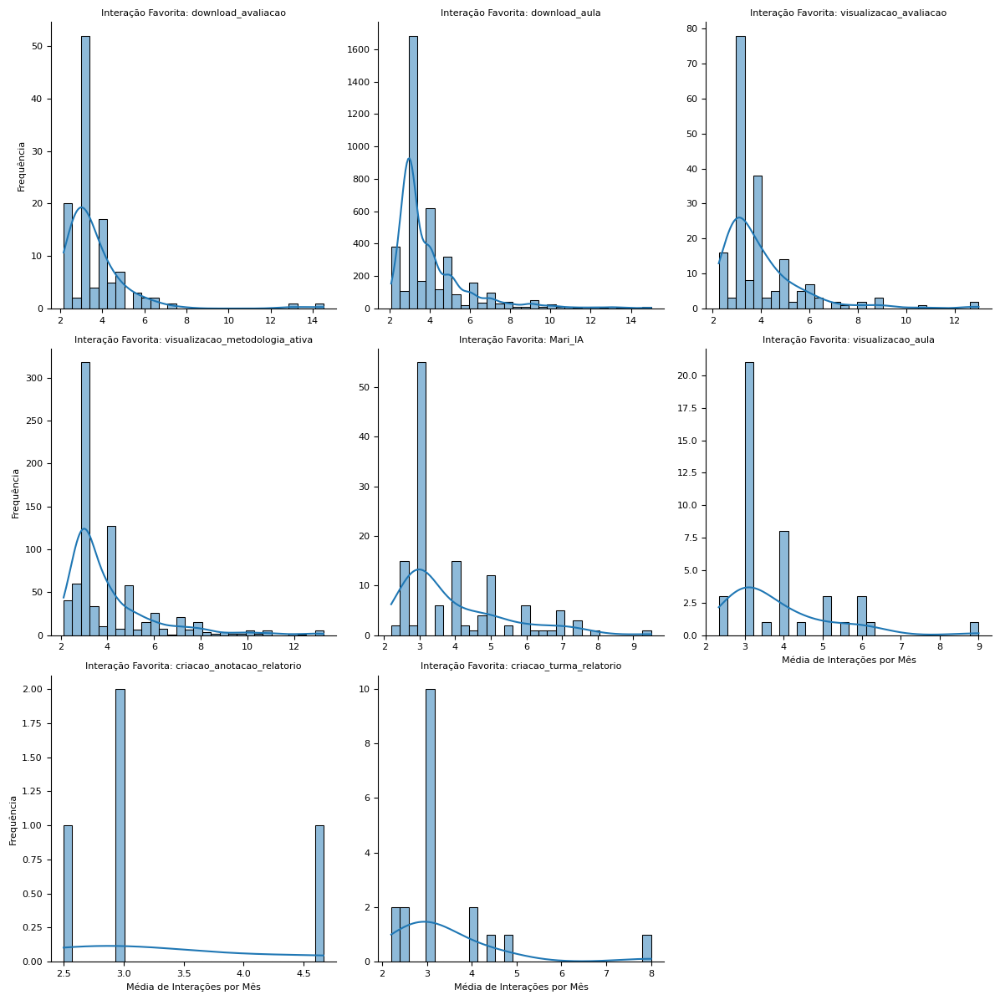

In [25]:
# Plot histogram of avg_interactions_per_month for each favorite_event_type

import matplotlib.pyplot as plt
import seaborn as sns

# Filtrar apenas usuários com média de interações por mês maior que 1
filtered = dim_teachers[dim_teachers['avg_interactions_per_month'] > 2]
filtered = filtered[filtered['avg_interactions_per_month'] <= 15] # Limitar a um máximo razoável para melhor visualização


# Build histogram of avg_interactions_per_month for each subject
g = sns.FacetGrid(
    filtered,
    col="favorite_event_type",
    col_wrap=3,         # adjust how many per row
    height=4,           # size of each subplot
    sharex=False,       # allow different scales per subject
    sharey=False
)

g.map(
    sns.histplot,
    "avg_interactions_per_month",
    bins=30,
    kde=True
)

g.set_axis_labels("Média de Interações por Mês", "Frequência")
g.set_titles("Interação Favorita: {col_name}")
plt.tight_layout()
plt.show()



A interação favorita dos usuários que mais utilizam a plataforma é 'download_aula', visto que a maior part dos usuários, com uma frequência de acesso na plataforma maior que 2 tem essa interação como favorita. 

Filtrando o ano de 2025 para pegar os usuários mais recentes:

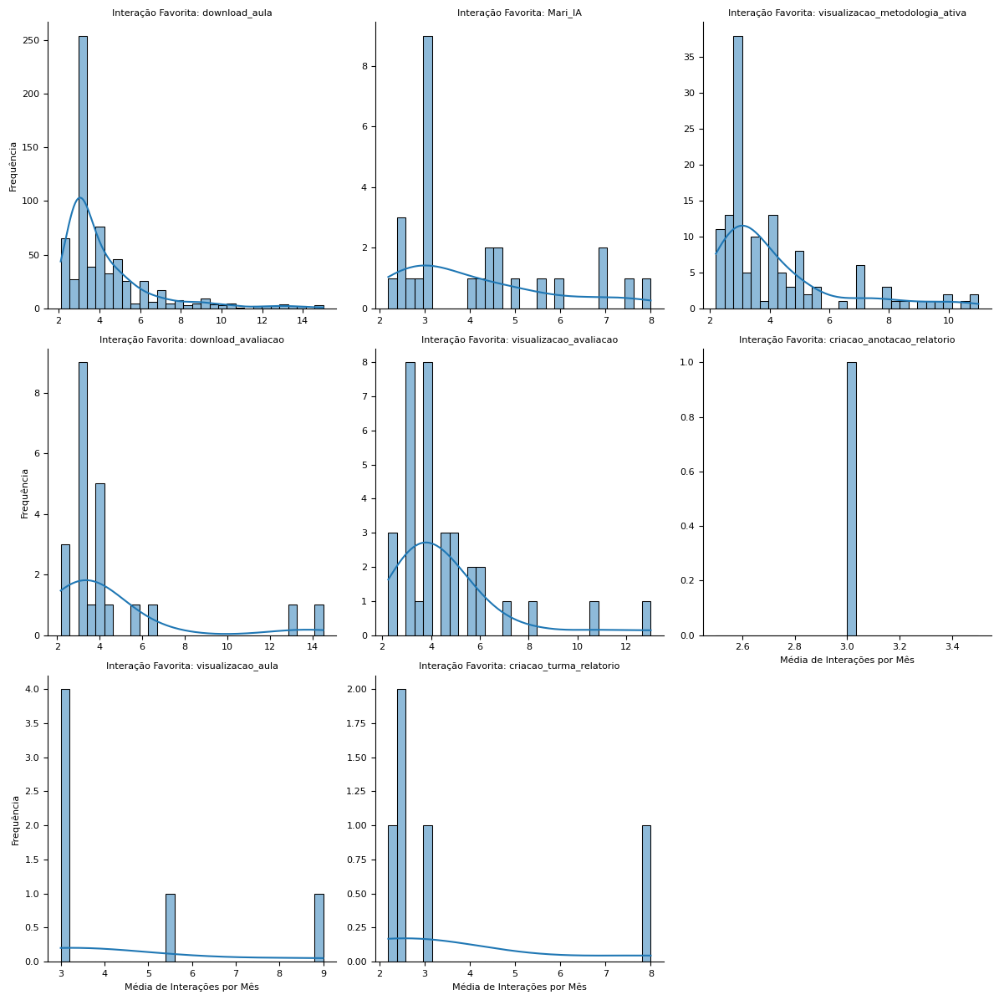

In [26]:
# Plot histogram of avg_interactions_per_month for each favorite_event_type

import matplotlib.pyplot as plt
import seaborn as sns

# Filtrar apenas usuários com média de interações por mês maior que 1
filtered = dim_teachers[dim_teachers['avg_interactions_per_month'] > 2]
filtered = filtered[filtered['avg_interactions_per_month'] <= 15] # Limitar a um máximo razoável para melhor visualização
# Filtrar para last_access_date em 2025
filtered = filtered[filtered['last_access_date'].dt.year == 2025]


# Build histogram of avg_interactions_per_month for each subject
g = sns.FacetGrid(
    filtered,
    col="favorite_event_type",
    col_wrap=3,         # adjust how many per row
    height=4,           # size of each subplot
    sharex=False,       # allow different scales per subject
    sharey=False
)

g.map(
    sns.histplot,
    "avg_interactions_per_month",
    bins=30,
    kde=True
)

g.set_axis_labels("Média de Interações por Mês", "Frequência")
g.set_titles("Interação Favorita: {col_name}")
plt.tight_layout()
plt.show()



Utilizando só os dados de 2025 (usuários mais recentes), não há muita mudança, a interação mais utilzada é o download da aula, porém há um aumento de usuários frequentes com a plataforma Mari IA, o que faz sentido, pois nesse ano há um maior uso de IAs em geral.

C:\Users\Marcel\AppData\Local\Temp\ipykernel_18236\256565738.py:59: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



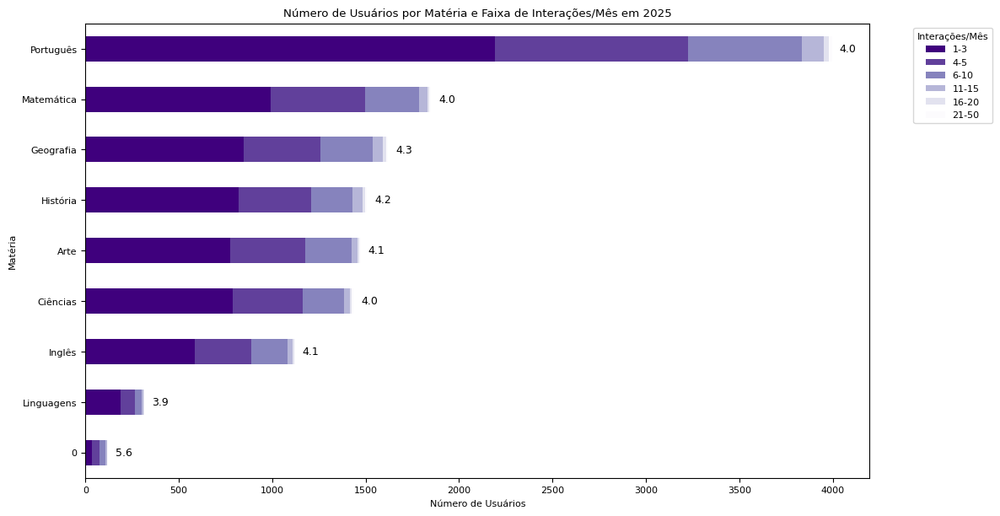

In [27]:
import pandas as pd
import matplotlib.pyplot as plt

# Filter only valid avg_interactions_per_month (exclude NaN)
dim_teachers_2025 = dim_teachers[
    (dim_teachers['last_access_date'].dt.year == 2025) &
    (dim_teachers['avg_interactions_per_month'].notnull())
]

# Group and count users
table = (
    dim_teachers_2025.groupby(['name_currentsubject', 'avg_interactions_per_month'], observed=True)
    .agg(num_users=('unique_id', 'nunique'))
    .reset_index()
    .sort_values(by='num_users', ascending=False)
)

# Filter outliers
table = table[table['avg_interactions_per_month'] < 40]

# Create bins of interactions (bins and labels must match)
bins = [0, 3, 5, 10, 15, 20, 50, 100]
labels = ["1-3", "4-5", "6-10", "11-15", "16-20", "21-50", "51-100"]

# Assign bins (exclude values <2)
table = table[table['avg_interactions_per_month'] >= 2]
table["interaction_bin"] = pd.cut(
    table["avg_interactions_per_month"],
    bins=bins,
    labels=labels,
    right=True,
    include_lowest=True
)

# Remove rows with NaN bins (outside bin range)
table = table[table['interaction_bin'].notnull()]

# Group by subject + bin and sum users
grouped = (
    table.groupby(["name_currentsubject", "interaction_bin"], observed=True)["num_users"]
    .sum()
    .reset_index()
)

# Pivot into wide format
pivot = grouped.pivot(
    index="name_currentsubject",
    columns="interaction_bin",
    values="num_users"
).fillna(0)

# Order subjects by total users
pivot["total"] = pivot.sum(axis=1)
pivot = pivot.sort_values("total", ascending=True)

# Compute weighted average interactions per subject
weighted_avg = (
    table.groupby("name_currentsubject")
    .apply(lambda x: (x["avg_interactions_per_month"] * x["num_users"]).sum() / x["num_users"].sum())
)

# Drop "total" for plotting
pivot_no_total = pivot.drop(columns="total")

# Plot stacked horizontal bar chart with purple reversed
ax = pivot_no_total.plot(
    kind="barh",
    stacked=True,
    figsize=(12, 7),
    colormap="Purples_r"
)

plt.title("Número de Usuários por Matéria e Faixa de Interações/Mês em 2025")
plt.xlabel("Número de Usuários")
plt.ylabel("Matéria")
plt.legend(title="Interações/Mês", bbox_to_anchor=(1.05, 1), loc="upper left")

# Add average interactions per month annotation
for i, subject in enumerate(pivot_no_total.index):
    avg_value = weighted_avg.get(subject, 0)
    total_users = pivot.loc[subject, "total"]
    ax.text(
        total_users + max(pivot["total"]) * 0.01,  # slightly offset to the right
        i,
        f"{avg_value:.1f}",
        va="center",
        fontsize=9,
        color="black"
    )

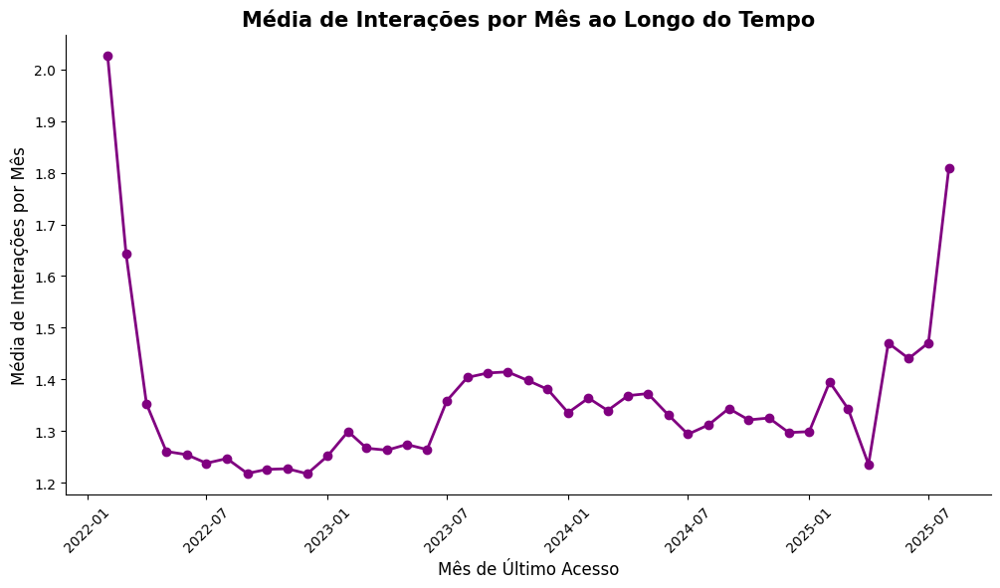

In [28]:
import pandas as pd
import matplotlib.pyplot as plt

# Filter out users with missing avg_interactions_per_month and last_access_date
df = dim_teachers[
    dim_teachers['avg_interactions_per_month'].notnull() &
    dim_teachers['last_access_date'].notnull()
].copy()

# Create a column for last_access_month
df['last_access_month'] = df['last_access_date'].dt.to_period('M')

# Group by last_access_month and calculate average interactions per month
timeline = (
    df.groupby('last_access_month')['avg_interactions_per_month']
    .mean()
    .reset_index()
)

# Convert last_access_month to datetime for plotting
timeline['last_access_month'] = timeline['last_access_month'].dt.to_timestamp()

# Plot the timeline (clean style)
plt.figure(figsize=(12, 6))
plt.plot(
    timeline['last_access_month'],
    timeline['avg_interactions_per_month'],
    marker='o',
    color='purple',
    linewidth=2
)
plt.title('Média de Interações por Mês ao Longo do Tempo', fontsize=15, weight='bold')
plt.xlabel('Mês de Último Acesso', fontsize=12)
plt.ylabel('Média de Interações por Mês', fontsize=12)
plt.xticks(rotation=45, fontsize=10)
plt.yticks(fontsize=10)
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.gca().spines['left'].set_visible(True)
plt.gca().spines['bottom'].set_visible(True)

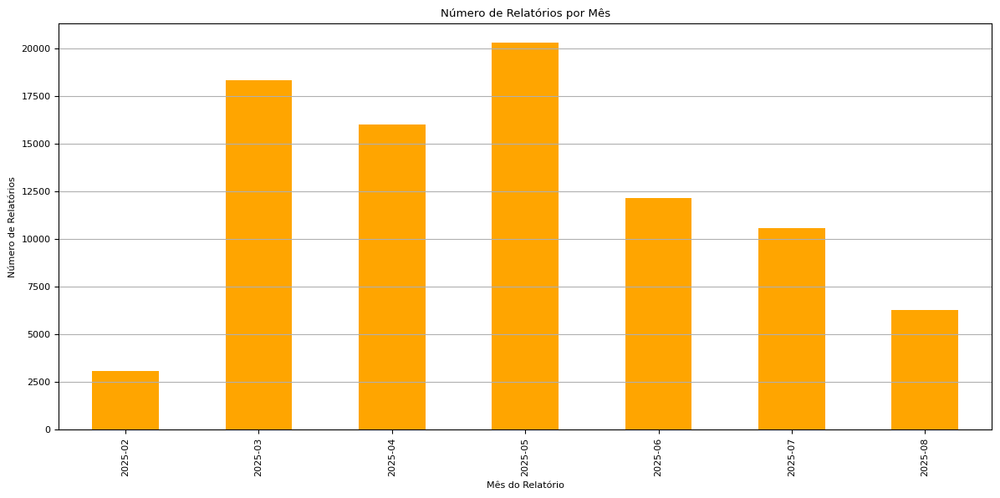

In [29]:
# from the table stg_mari_ia_reports, build a chart showing the number of reports by month - use the updatedat column
stg_mari_ia_reports['updatedat'] = pd.to_datetime(stg_mari_ia_reports['updatedat'])
stg_mari_ia_reports['report_month'] = stg_mari_ia_reports['updatedat'].dt.to_period('M')
report_counts = stg_mari_ia_reports['report_month'].value_counts().sort_index()
plt.figure(figsize=(12, 6))
report_counts.plot(kind='bar', color='orange')
plt.title('Número de Relatórios por Mês')
plt.xlabel('Mês do Relatório')
plt.ylabel('Número de Relatórios')
plt.grid(axis='y')
plt.tight_layout()
plt.show()



In [30]:
# Select max date between last_access_date and last_access_ia
dim_teachers_2025['last_access_final'] = dim_teachers_2025[['last_access_date', 'last_access_ia']].max(axis=1)
# Create a column with the days since the last_access_final
dim_teachers_2025['days_since_last_access_final'] = (last_date - dim_teachers_2025['last_access_final']).dt.days
# Create df for clustering
dim_teachers_df_cluster = dim_teachers_2025.drop(columns=['profid', 'login_google', 'selectedstages', 'selectedsubjectsem', 
                                                          'selectedsubjectsfundii', 
                                                          'data_entrada','last_access_date','last_access_ia','last_access_month',
                                                          'data_entrada_month','last_access_final'])

C:\Users\Marcel\AppData\Local\Temp\ipykernel_18236\2643764603.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Marcel\AppData\Local\Temp\ipykernel_18236\2643764603.py:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [31]:
dim_teachers_df_cluster = dim_teachers_df_cluster.drop(columns=['days_since_last_access', 'lifetime_months'])


In [32]:
# Change the null values from visualizou_metodologia_ativa to 0
dim_teachers_df_cluster['visualizou_metodologia_ativa'] = dim_teachers_df_cluster['visualizou_metodologia_ativa'].fillna(0)
# Change the null values from total_alunos to the mean of the column
dim_teachers_df_cluster['total_alunos'] = dim_teachers_df_cluster['total_alunos'].fillna(dim_teachers_df_cluster['total_alunos'].mean())


### 9. Verificar correlação entre as variáveis:

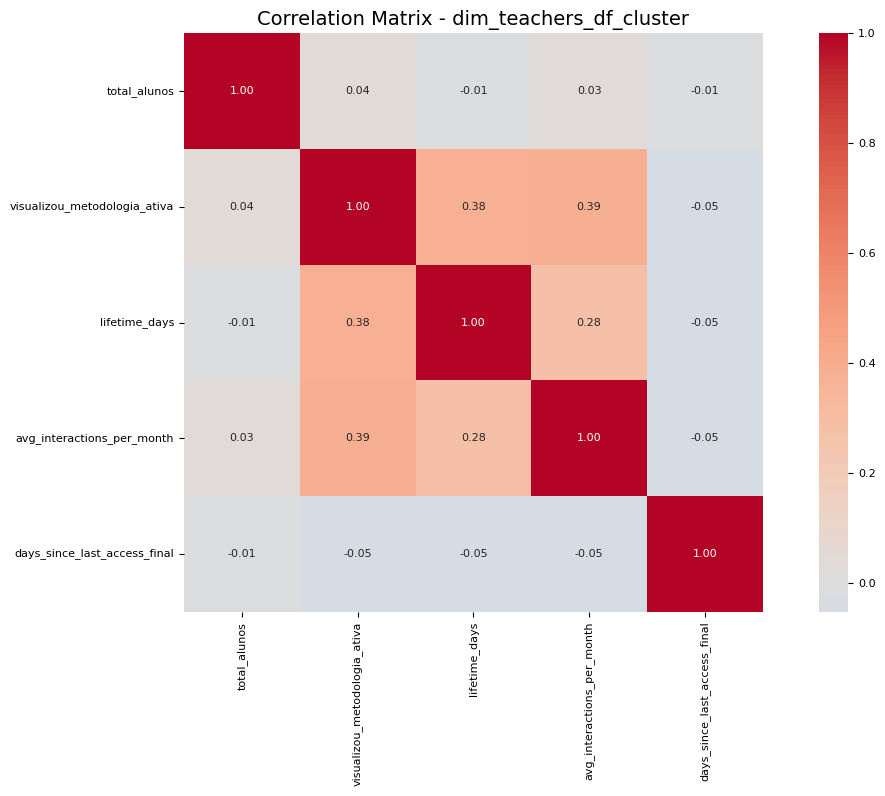

In [33]:
import matplotlib.pyplot as plt
import seaborn as sns

# === 1. Select only numeric columns ===
df_numeric = dim_teachers_df_cluster.select_dtypes(include=["number"])

# === 2. Compute correlation matrix ===
corr = df_numeric.corr()

# === 3. Plot heatmap ===
plt.figure(figsize=(12, 8))
sns.heatmap(
    corr,
    annot=True, fmt=".2f",
    cmap="coolwarm", center=0,
    cbar=True, square=True
)
plt.title("Correlation Matrix - dim_teachers_df_cluster", fontsize=14)
plt.tight_layout()
plt.show()

## 10. Primeiro Modelo: Clusterização utilizando K-Means


Silhouette Score (4 clusters): 0.466

Cluster Centroids (Original Scale):
         total_alunos  visualizou_metodologia_ativa  lifetime_days  \
cluster                                                              
0           53.139412                      0.025603      42.210297   
1           53.238245                      0.020599      27.426364   
2           51.720170                      0.013120      17.272865   
3           58.374558                      0.239130     292.902174   

         avg_interactions_per_month  days_since_last_access_final  \
cluster                                                             
0                          1.411652                     94.664377   
1                          1.370642                    105.661824   
2                          1.249580                    169.326710   
3                          3.757523                     96.347826   

         utm_origin_Google Ads  utm_origin_Landing Page  \
cluster                        

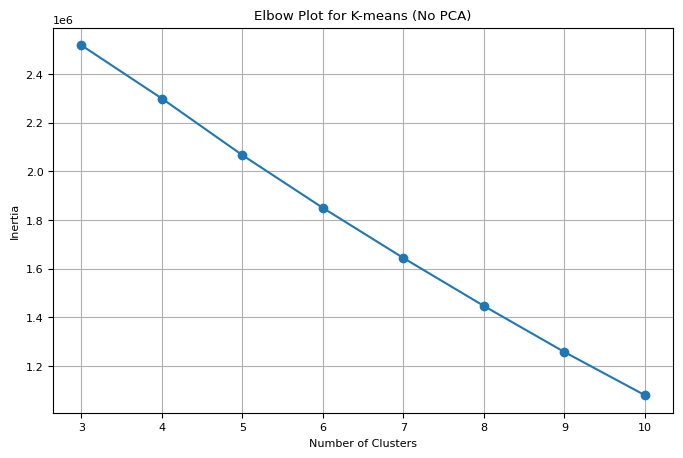

In [34]:
import pandas as pd
import numpy as np
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import silhouette_score
from sklearn.preprocessing import OneHotEncoder
import matplotlib.pyplot as plt
import seaborn as sns

# === 1. Prepare data ===
df_clustered = dim_teachers_df_cluster.copy()

# Separate categorical and numeric columns
categorical_cols = ['utm_origin', 'tela_origem']
numeric_cols = ['total_alunos', 'visualizou_metodologia_ativa', 
                'lifetime_days', 'avg_interactions_per_month', 
                'days_since_last_access_final']

# One-hot encode categorical variables
df_encoded = pd.get_dummies(df_clustered[categorical_cols], drop_first=True)

# Combine numeric + encoded categorical
df_k = pd.concat([df_clustered[numeric_cols], df_encoded], axis=1)

# === 2. Standardize features ===
scaler = StandardScaler()
df_scaled = pd.DataFrame(scaler.fit_transform(df_k), columns=df_k.columns)

# === 3. K-means with 4 clusters ===
kmeans = KMeans(n_clusters=4, random_state=42, n_init=10)
df_k['cluster'] = kmeans.fit_predict(df_scaled)

# === 4. Evaluate clustering ===
silhouette_avg = silhouette_score(df_scaled, df_k['cluster'])
print(f"Silhouette Score (4 clusters): {silhouette_avg:.3f}")

# Compute centroids (original scale, not standardized)
centroids = df_k.groupby('cluster').mean()
print("\nCluster Centroids (Original Scale):")
print(centroids)

# === 5. Elbow method plot ===
inertia = []
K_range = range(3, 11)
for k in K_range:
    kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
    kmeans.fit(df_scaled)
    inertia.append(kmeans.inertia_)

plt.figure(figsize=(8, 5))
plt.plot(K_range, inertia, marker='o')
plt.title('Elbow Plot for K-means (No PCA)')
plt.xlabel('Number of Clusters')
plt.ylabel('Inertia')
plt.grid(True)
plt.show()

# === 6. Add cluster labels back to original df (optional) ===
# df_clustered['cluster'] = df_k['cluster']


### 11. Segundo Modelo: K-Means com PCA

Numerical features: ['total_alunos', 'visualizou_metodologia_ativa', 'lifetime_days', 'avg_interactions_per_month', 'days_since_last_access_final']
Boolean features: []
Silhouette Score (3 clusters, PCA + boolean): 0.883

Cluster Centroids (Standardized PCA + Boolean):
              PC1       PC2
cluster                    
0.0      0.002737 -0.003512
1.0     -0.029015 -0.020919
2.0     -0.168181  0.005916

PCA Loadings:
                                   PC1       PC2
total_alunos                  0.049164  0.983014
visualizou_metodologia_ativa  0.605386 -0.002334
lifetime_days                 0.551995 -0.111744
avg_interactions_per_month    0.558479 -0.004923
days_since_last_access_final -0.120388 -0.145490


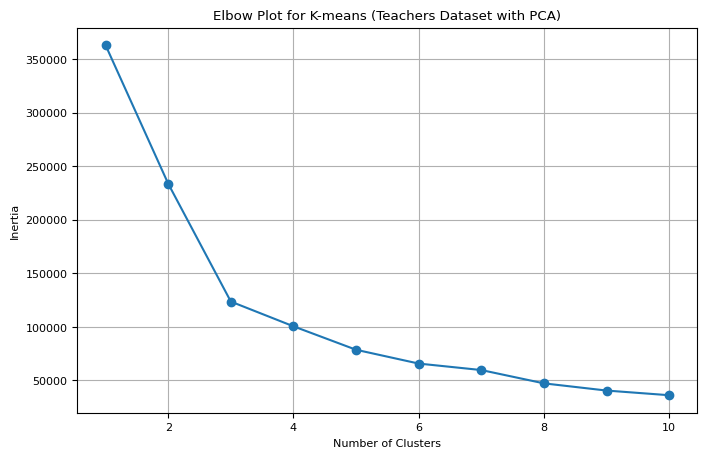

In [35]:
import pandas as pd
import numpy as np
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt
import seaborn as sns

# === 1. Select numeric features ===
numerical_features = [
    "total_alunos",
    "visualizou_metodologia_ativa",
    "lifetime_days",
    "avg_interactions_per_month",
    "days_since_last_access_final"
]

# === 2. Detect boolean (dummy-like) features ===
boolean_features = [
    col for col in dim_teachers_df_cluster.columns 
    if dim_teachers_df_cluster[col].dropna().isin([0, 1]).all()
    and col not in numerical_features
]

print("Numerical features:", numerical_features)
print("Boolean features:", boolean_features)

# === 3. Standardize numerical features ===
scaler = StandardScaler()
df_numerical_scaled = pd.DataFrame(
    scaler.fit_transform(dim_teachers_df_cluster[numerical_features]),
    columns=numerical_features
)

# === 4. Apply PCA (reduce to 2D for visualization) ===
n_components = min(len(numerical_features), 2)
pca = PCA(n_components=n_components, random_state=42)
pca_features = pca.fit_transform(df_numerical_scaled)
pca_columns = [f"PC{i+1}" for i in range(n_components)]
df_pca = pd.DataFrame(pca_features, columns=pca_columns)

# === 5. Combine PCA with boolean features ===
df_combined = pd.concat(
    [df_pca, dim_teachers_df_cluster[boolean_features].reset_index(drop=True)],
    axis=1
)

# === 6. Standardize combined features ===
df_combined_scaled = pd.DataFrame(
    scaler.fit_transform(df_combined),
    columns=df_combined.columns
)

# === 7. Run KMeans ===
kmeans = KMeans(n_clusters=3, random_state=42, n_init=10)
dim_teachers_df_cluster["cluster"] = kmeans.fit_predict(df_combined_scaled)

# === 8. Evaluate clustering ===
silhouette_avg = silhouette_score(df_combined_scaled, dim_teachers_df_cluster["cluster"])
print(f"Silhouette Score (3 clusters, PCA + boolean): {silhouette_avg:.3f}")

# === 9. Centroids (cluster profiles in standardized space) ===
centroids = df_combined_scaled.groupby(dim_teachers_df_cluster["cluster"]).mean()
print("\nCluster Centroids (Standardized PCA + Boolean):")
print(centroids)

# === 10. PCA Loadings (numerical contribution to PCs) ===
loadings = pd.DataFrame(
    pca.components_.T,
    columns=pca_columns,
    index=numerical_features
)
print("\nPCA Loadings:")
print(loadings)

# === 11. Elbow plot ===
inertia = []
K_range = range(1, 11)
for k in K_range:
    kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
    kmeans.fit(df_combined_scaled)
    inertia.append(kmeans.inertia_)

plt.figure(figsize=(8, 5))
plt.plot(K_range, inertia, marker="o")
plt.title("Elbow Plot for K-means (Teachers Dataset with PCA)")
plt.xlabel("Number of Clusters")
plt.ylabel("Inertia")
plt.grid(True)
plt.show()


Modelo apresentou Silhouette Score maior, portanto será o usado para o projeto.

In [36]:
import pandas as pd
import numpy as np
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt
import seaborn as sns

# Define numerical and boolean features
numerical_features = [
    "total_alunos",
    "visualizou_metodologia_ativa",
    "lifetime_days",
    "avg_interactions_per_month",
    "days_since_last_access_final"
]

boolean_features = [
    col for col in dim_teachers_df_cluster.columns 
    if dim_teachers_df_cluster[col].dropna().isin([0, 1]).all()
    and col not in numerical_features
]

# Standardize numerical features
scaler = StandardScaler()
df_numerical_scaled = pd.DataFrame(
    scaler.fit_transform(dim_teachers_df_cluster[numerical_features]), 
    columns=numerical_features
)

# Apply PCA to numerical features
n_components = min(len(numerical_features), 2)  # Use 2 for visualization
pca = PCA(n_components=n_components, random_state=42)
pca_features = pca.fit_transform(df_numerical_scaled)
pca_columns = [f'PC{i+1}' for i in range(n_components)]
df_pca = pd.DataFrame(pca_features, columns=pca_columns)

# Combine PCA features with boolean features
df_combined = pd.concat(
    [df_pca, dim_teachers_df_cluster[boolean_features].reset_index(drop=True)], 
    axis=1
)

# Standardize combined features
df_combined_scaled = pd.DataFrame(
    scaler.fit_transform(df_combined), 
    columns=df_combined.columns
)

# K-means clustering
kmeans = KMeans(n_clusters=3, random_state=42, n_init=10)
dim_teachers_df_cluster['cluster'] = kmeans.fit_predict(df_combined_scaled)

# Silhouette score
silhouette_avg = silhouette_score(df_combined_scaled, dim_teachers_df_cluster['cluster'])
print(f"Silhouette Score (3 clusters, PCA + boolean): {silhouette_avg:.3f}")


Silhouette Score (3 clusters, PCA + boolean): 0.883


### 12. Análise dos Clusters

In [37]:
dim_teachers_df_cluster['cluster'] = kmeans.labels_
cluster_profiles = dim_teachers_df_cluster.groupby('cluster')[numerical_features + boolean_features].mean()
print(cluster_profiles)

         total_alunos  visualizou_metodologia_ativa  lifetime_days  \
cluster                                                              
0           52.077190                      0.000000      17.572185   
1           40.200154                      0.635770     527.787387   
2          416.138571                      0.318571     179.344286   

         avg_interactions_per_month  days_since_last_access_final  
cluster                                                            
0                          1.246040                    104.229969  
1                          4.986643                     86.388915  
2                          4.527261                     93.392857  


In [49]:
# Se o avg_interactions_per_month for maior do que 3, mando para o grupo 1, pois tem mais engajamento:

# Trocar cluster de 0 para 1 se avg_interactions_per_month > 3
mask = (dim_teachers_df_cluster['cluster'] == 0) & (dim_teachers_df_cluster['avg_interactions_per_month'] > 3)
dim_teachers_df_cluster.loc[mask, 'cluster'] = 1

In [38]:
dim_teachers_df_cluster['cluster'].value_counts()

cluster
0    174545
1      6279
2       700
Name: count, dtype: int64

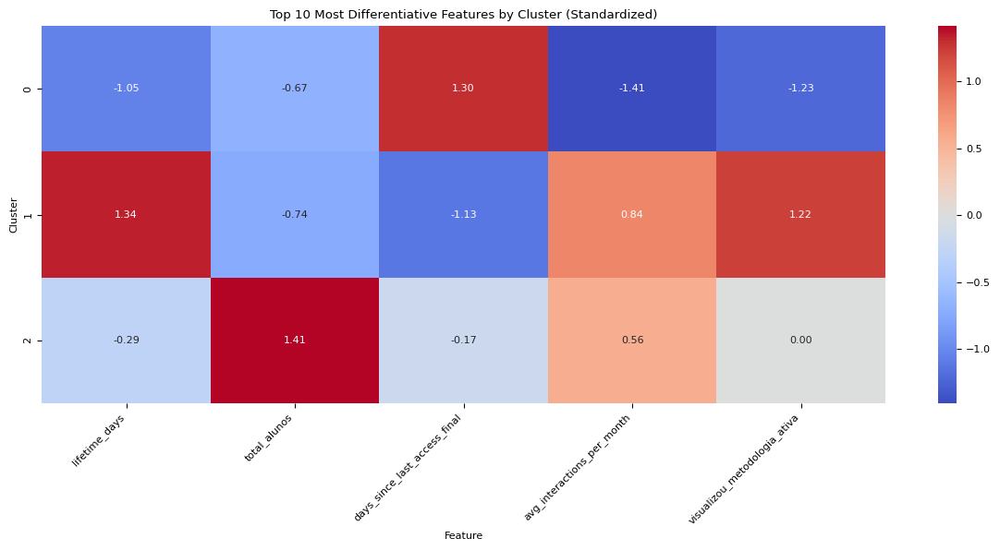

In [39]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler

# Suponha que este seja o seu DataFrame com médias por cluster
cluster_means = cluster_profiles.copy()

# 1. Calcular variância entre clusters para cada variável
variances = cluster_means.var(axis=0)

# 2. Selecionar as N variáveis mais diferenciadoras
top_n = 10  # você pode ajustar esse valor
top_features = variances.sort_values(ascending=False).head(top_n).index

# 3. Filtrar o DataFrame de médias apenas com essas variáveis
cluster_means_top = cluster_means[top_features]

# 4. Padronizar (z-score: média 0, desvio padrão 1)
scaler = StandardScaler()
cluster_means_top_scaled = pd.DataFrame(
    scaler.fit_transform(cluster_means_top),
    columns=cluster_means_top.columns,
    index=cluster_means_top.index
)

# 5. Plotar heatmap com os dados padronizados
plt.figure(figsize=(12, 6))
sns.heatmap(cluster_means_top_scaled, annot=True, fmt=".2f", cmap="coolwarm", center=0)
plt.title(f'Top {top_n} Most Differentiative Features by Cluster (Standardized)')
plt.ylabel('Cluster')
plt.xlabel('Feature')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

### 13. Correlação entre total de alunos e dias desde último acesso

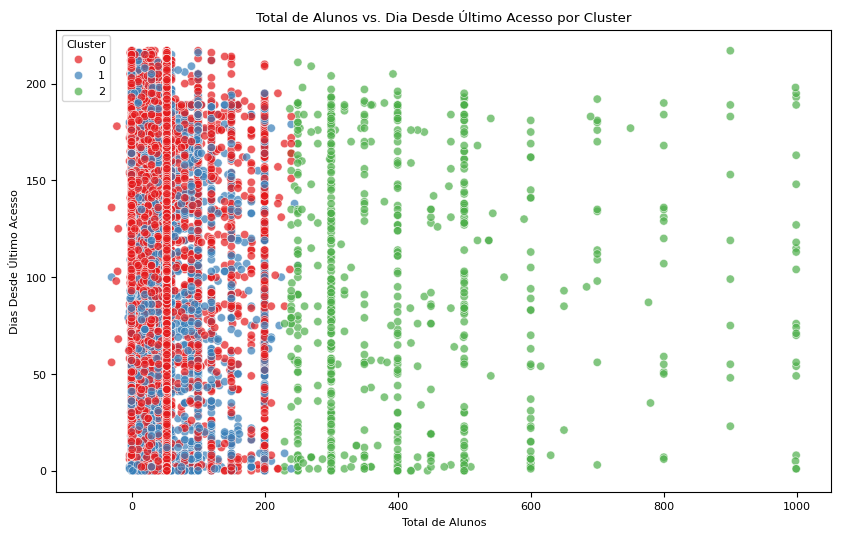

In [40]:
# Scatter plot of total_alunos by days_since_last_access_final colored by cluster
plt.figure(figsize=(10, 6))
sns.scatterplot(
    data=dim_teachers_df_cluster,
    x='total_alunos',
    y='days_since_last_access_final',
    hue='cluster',
    palette='Set1',
    alpha=0.7
)
plt.title('Total de Alunos vs. Dia Desde Último Acesso por Cluster')
plt.xlabel('Total de Alunos')
plt.ylabel('Dias Desde Último Acesso')
plt.legend(title='Cluster')
plt.show()

### 14. Relação entre Lifetime Days e Média de Interações por Mês

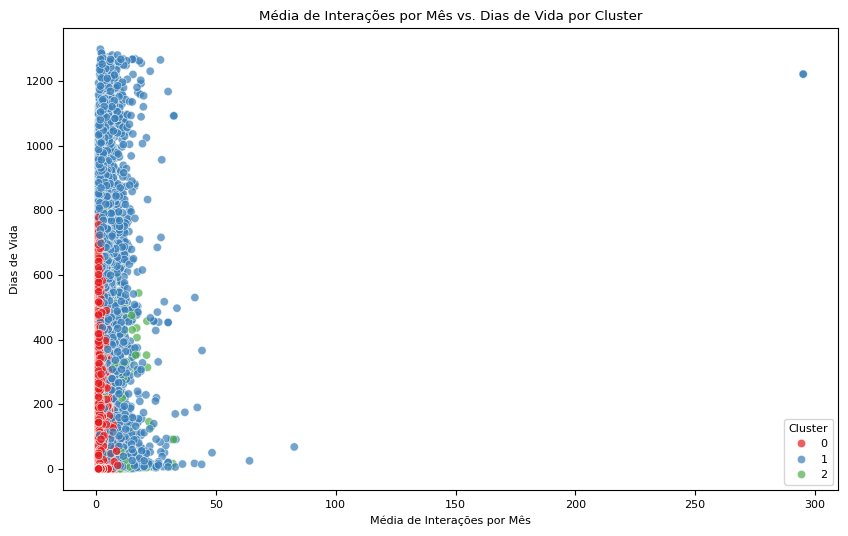

In [41]:
# Scatter plot of avg_interactions_per_month by lifetime_days colored by cluster
plt.figure(figsize=(10, 6))
sns.scatterplot(
    data=dim_teachers_df_cluster,
    x='avg_interactions_per_month',
    y='lifetime_days',
    hue='cluster',
    palette='Set1',
    alpha=0.7
)
plt.title('Média de Interações por Mês vs. Dias de Vida por Cluster')
plt.xlabel('Média de Interações por Mês')
plt.ylabel('Dias de Vida')
plt.legend(title='Cluster')
plt.show()

### 15. Número de Professores de Cada Matéria por Cluster

In [42]:
# Table showing the percentage of users in each cluster in each subject. Call the table table_percentage

# Count users per subject and cluster
table_counts = (
    dim_teachers_df_cluster
    .groupby(['name_currentsubject', 'cluster'], observed=True)
    .agg(num_users=('unique_id', 'nunique'))
    .reset_index()
)

# Total users per subject
subject_totals = (
    table_counts
    .groupby('name_currentsubject')['num_users']
    .sum()
    .reset_index()
    .rename(columns={'num_users': 'total_users'})
)

# Merge to get total per subject
table_counts = table_counts.merge(subject_totals, on='name_currentsubject', how='left')

# Calculate percentage
table_counts['percentage'] = 100 * table_counts['num_users'] / table_counts['total_users']

# Pivot to wide format: subjects as rows, clusters as columns, values as percentage
table_percentage = table_counts.pivot(
    index='name_currentsubject',
    columns='cluster',
    values='percentage'
).fillna(0).round(1).reset_index()

table_percentage

cluster,name_currentsubject,0,1,2
0,0,25.4,68.0,6.6
1,Arte,54.7,38.7,6.6
2,Ciências,60.8,34.0,5.2
3,Geografia,56.1,38.8,5.1
4,História,57.2,37.1,5.7
5,Inglês,49.8,42.1,8.1
6,Linguagens,72.3,21.5,6.2
7,Matemática,57.2,40.0,2.9
8,Português,57.4,39.2,3.4


C:\Users\Marcel\AppData\Local\Temp\ipykernel_18236\3176116887.py:28: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`



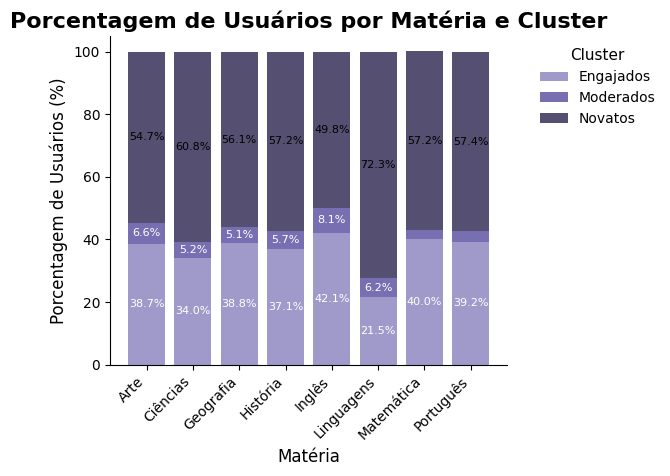

cluster,Engajados,Moderados,Novatos
name_currentsubject,,,
0,83,8,31
Arte,613,105,867
Ciências,529,81,946
Geografia,675,88,977
História,600,93,925
Inglês,499,96,590
Linguagens,73,21,245
Matemática,806,58,1153
Português,1705,150,2497


In [43]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Map cluster numbers to names
cluster_name_map = {0: "Novatos", 1: "Engajados", 2: "Moderados"}

# Melt and map cluster labels
table_melted = table_percentage.melt(id_vars='name_currentsubject', var_name='cluster', value_name='percentage')
table_melted = table_melted[table_melted['name_currentsubject'] != '0']
table_melted['cluster'] = table_melted['cluster'].map(cluster_name_map)

# Pivot the data to get percentages for each subject and cluster
pivot_table = table_melted.pivot_table(values='percentage', index='name_currentsubject', columns='cluster', fill_value=0)

# Create a stacked bar plot
subjects = pivot_table.index
clusters = pivot_table.columns
bottom = None

purple_palette = sns.color_palette("Purples_d", n_colors=len(clusters))

for idx, cluster in enumerate(clusters):
    values = pivot_table[cluster]
    plt.bar(subjects, values, bottom=bottom, label=cluster, color=purple_palette[idx])
    for i, (subject, value) in enumerate(values.items()):
        if value > 5:
            y_pos = value / 2 if bottom is None else bottom[i] + value / 2
            text_color = 'white' if idx < len(clusters) / 2 else 'black'
            plt.text(i, y_pos, f'{value:.1f}%', ha='center', va='center', fontsize=8, color=text_color)
    if bottom is None:
        bottom = values
    else:
        bottom += values

plt.title('Porcentagem de Usuários por Matéria e Cluster', fontsize=16, weight='bold')
plt.xlabel('Matéria', fontsize=12)
plt.ylabel('Porcentagem de Usuários (%)', fontsize=12)
plt.xticks(rotation=45, ha='right', fontsize=10)
plt.yticks(fontsize=10)
plt.legend(title='Cluster', bbox_to_anchor=(1.05, 1), loc='upper left', frameon=False, fontsize=10, title_fontsize=11)
sns.despine(top=True, right=True)
plt.tight_layout()
plt.show()

# Table with cluster names as columns
table_clusters = (
    dim_teachers_df_cluster.groupby(['name_currentsubject', 'cluster'], observed=True)
    .agg(num_users=('unique_id', 'nunique'))
    .reset_index()
)
table_clusters['cluster'] = table_clusters['cluster'].map(cluster_name_map)
table_clusters = (
    table_clusters.pivot(index='name_currentsubject', columns='cluster', values='num_users')
    .fillna(0)
    .astype(int)
)
table_clusters